# 04. Exploratory Data Analysis - PySpark

## 04.1. Importação das bibliotecas

### 04.1.1. Importando as bibliotecas nativas do Python

In [1]:
import sys

### 04.1.2. Importando as bibliotecas de terceiros

In [2]:
import matplotlib.pyplot as plt
import pandas as pd
from pyspark.sql import SparkSession, types as T
from pyspark.sql.functions import *

### 04.1.3. Importando os módulos locais do projeto

In [3]:
sys.path.append('..')
import functions.fn_charts_pandas as fn_charts_pandas
import functions.fn_stats_pyspark as fn_stats_pyspark
import params.consts as consts

## 04.2. Visão geral dos dados

### 04.2.0. Iniciando a sessão Spark

In [4]:
spark = SparkSession.builder.appName('spark').getOrCreate()

### 04.2.1. Habilitando a exibição de todas as colunas

In [5]:
pd.set_option('display.max_columns', None)

### 04.2.2. Armazenando o dataset em uma variável

In [6]:
df = spark.read \
    .format('parquet') \
    .load(consts.DATASET_CLEAN_PYSPARK)

### 04.2.3. Visualizando a quantidade de linhas e colunas do dataset

In [7]:
(df.count(), len(df.columns))

(2205, 22)

### 04.2.4. Exibindo o dataset

In [8]:
df.show(5)

+----------+--------------+--------+-----------+---+--------+-------+-------+--------+-----------------+-------------------+-------------------+--------------------+-----------------+-----------------+-----------------+---------------+------------+--------+----------------+--------------+--------+
| Education|Marital_Status|Children|HasChildren|Age|AgeGroup| Income|Recency|Complain|Dt_Customer_Month|Dt_Customer_Quarter|Days_Since_Enrolled|Years_Since_Enrolled|NumDealsPurchases|NumWebVisitsMonth|NumTotalPurchases|MntRegularProds|MntGoldProds|MntTotal|AcceptedCmpTotal|HasAcceptedCmp|Response|
+----------+--------------+--------+-----------+---+--------+-------+-------+--------+-----------------+-------------------+-------------------+--------------------+-----------------+-----------------+-----------------+---------------+------------+--------+----------------+--------------+--------+
|       PhD|        Single|       1|          1| 63|     61+|67680.0|      8|       0|                6

### 04.2.5. Visualizando os detalhes do dataset

In [9]:
df.printSchema()

root
 |-- Education: string (nullable = true)
 |-- Marital_Status: string (nullable = true)
 |-- Children: integer (nullable = true)
 |-- HasChildren: integer (nullable = true)
 |-- Age: integer (nullable = true)
 |-- AgeGroup: string (nullable = true)
 |-- Income: double (nullable = true)
 |-- Recency: integer (nullable = true)
 |-- Complain: integer (nullable = true)
 |-- Dt_Customer_Month: integer (nullable = true)
 |-- Dt_Customer_Quarter: integer (nullable = true)
 |-- Days_Since_Enrolled: integer (nullable = true)
 |-- Years_Since_Enrolled: long (nullable = true)
 |-- NumDealsPurchases: integer (nullable = true)
 |-- NumWebVisitsMonth: integer (nullable = true)
 |-- NumTotalPurchases: integer (nullable = true)
 |-- MntRegularProds: integer (nullable = true)
 |-- MntGoldProds: integer (nullable = true)
 |-- MntTotal: integer (nullable = true)
 |-- AcceptedCmpTotal: integer (nullable = true)
 |-- HasAcceptedCmp: integer (nullable = true)
 |-- Response: integer (nullable = true)



### 04.2.6. Visualizando as estatísticas das colunas numéricas

In [10]:
fn_stats_pyspark.summary(df).show(truncate = False)

+-------+---------+--------------+--------+-----------+------+--------+--------+-------+--------+-----------------+-------------------+-------------------+--------------------+-----------------+-----------------+-----------------+---------------+------------+--------+----------------+--------------+--------+
|summary|Education|Marital_Status|Children|HasChildren|Age   |AgeGroup|Income  |Recency|Complain|Dt_Customer_Month|Dt_Customer_Quarter|Days_Since_Enrolled|Years_Since_Enrolled|NumDealsPurchases|NumWebVisitsMonth|NumTotalPurchases|MntRegularProds|MntGoldProds|MntTotal|AcceptedCmpTotal|HasAcceptedCmp|Response|
+-------+---------+--------------+--------+-----------+------+--------+--------+-------+--------+-----------------+-------------------+-------------------+--------------------+-----------------+-----------------+-----------------+---------------+------------+--------+----------------+--------------+--------+
|count  |2205     |2205          |2205.0  |2205.0     |2205.0|2205    

### 04.2.7. Visualizando as estatísticas da colunas categóricas

In [11]:
categorical_columns = [field.name for field in df.schema.fields if isinstance(field.dataType, T.StringType)]

df.describe(categorical_columns).show()

+-------+---------+--------------+--------+
|summary|Education|Marital_Status|AgeGroup|
+-------+---------+--------------+--------+
|  count|     2205|          2205|    2205|
|   mean|     NULL|          NULL|    NULL|
| stddev|     NULL|          NULL|    NULL|
|    min| 2n Cycle|       Partner|   18-30|
|    max|      PhD|        Single|     61+|
+-------+---------+--------------+--------+



### 04.2.8. Verificando os valores nulos das colunas

In [12]:
df.select([count(when(col(c).isNull(), c)).alias(c) for c in df.columns]).show()

+---------+--------------+--------+-----------+---+--------+------+-------+--------+-----------------+-------------------+-------------------+--------------------+-----------------+-----------------+-----------------+---------------+------------+--------+----------------+--------------+--------+
|Education|Marital_Status|Children|HasChildren|Age|AgeGroup|Income|Recency|Complain|Dt_Customer_Month|Dt_Customer_Quarter|Days_Since_Enrolled|Years_Since_Enrolled|NumDealsPurchases|NumWebVisitsMonth|NumTotalPurchases|MntRegularProds|MntGoldProds|MntTotal|AcceptedCmpTotal|HasAcceptedCmp|Response|
+---------+--------------+--------+-----------+---+--------+------+-------+--------+-----------------+-------------------+-------------------+--------------------+-----------------+-----------------+-----------------+---------------+------------+--------+----------------+--------------+--------+
|        0|             0|       0|          0|  0|       0|     0|      0|       0|                0|       

### 04.2.9. Verificando os valores distintos das colunas

In [13]:
df.select([count_distinct(c).alias(c) for c in df.columns]).show()

+---------+--------------+--------+-----------+---+--------+------+-------+--------+-----------------+-------------------+-------------------+--------------------+-----------------+-----------------+-----------------+---------------+------------+--------+----------------+--------------+--------+
|Education|Marital_Status|Children|HasChildren|Age|AgeGroup|Income|Recency|Complain|Dt_Customer_Month|Dt_Customer_Quarter|Days_Since_Enrolled|Years_Since_Enrolled|NumDealsPurchases|NumWebVisitsMonth|NumTotalPurchases|MntRegularProds|MntGoldProds|MntTotal|AcceptedCmpTotal|HasAcceptedCmp|Response|
+---------+--------------+--------+-----------+---+--------+------+-------+--------+-----------------+-------------------+-------------------+--------------------+-----------------+-----------------+-----------------+---------------+------------+--------+----------------+--------------+--------+
|        5|             2|       4|          2| 56|       4|  1963|    100|       2|               12|       

### 04.2.10. Verificando os registos totalmente duplicados

In [14]:
df.count() - df.dropDuplicates().count()

185

### 04.2.11. Verificando a quantidade de colunas numéricas, categóricas e de data

In [15]:
num_cols = __builtins__.sum(isinstance(df.schema[c].dataType, T.NumericType) for c in df.columns)

categ_cols = __builtins__.sum(isinstance(df.schema[c].dataType, T.StringType) for c in df.columns)

date_cols = __builtins__.sum(isinstance(df.schema[c].dataType, (T.DateType, T.TimestampType)) for c in df.columns)

print(f'- Numeric Columns: {num_cols}\n- Categoric Columns: {categ_cols}\n- Date Columns: {date_cols}')

- Numeric Columns: 19
- Categoric Columns: 3
- Date Columns: 0


## 04.3. Análise exploratória dos dados

### 04.3.0. Convertendo o df PySpark para Pandas

In [16]:
df_pd = df.toPandas()

### 04.3.1. Criando gráficos de contagem e histogramas para entender a distribuição dos dados das colunas

- Gráfico: Gráfico de Contagem.


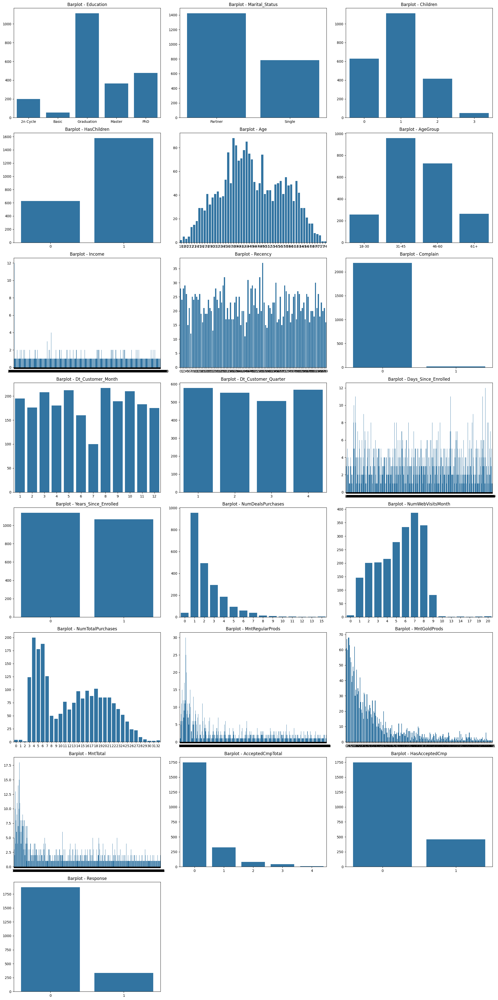

In [17]:
print('- Gráfico: Gráfico de Contagem.')

fn_charts_pandas.countplot(df_pd, df_pd.columns)

plt.savefig(f'../images/outputs/charts/pyspark/nb04_countplot.png', format = 'png', dpi = 75, bbox_inches = 'tight', transparent = True)

plt.show()

- Gráfico: Histograma.


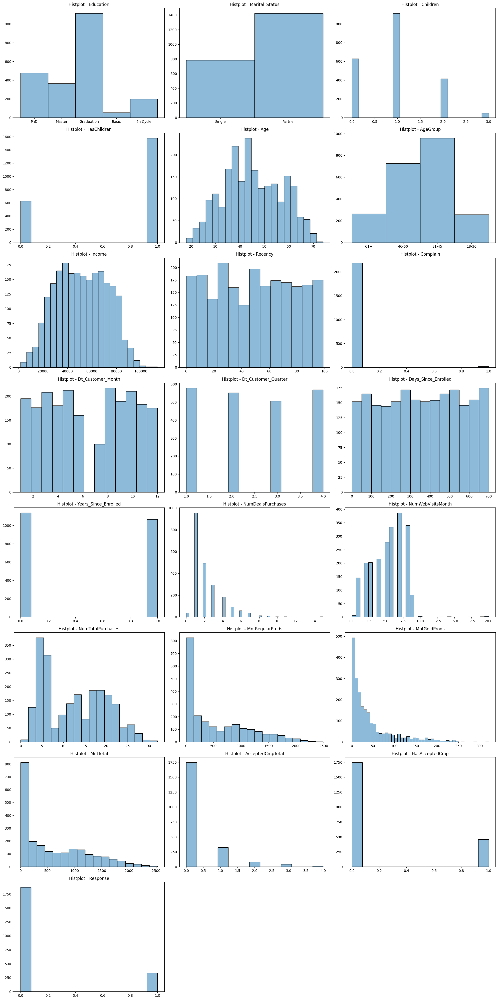

In [18]:
print('- Gráfico: Histograma.')

fn_charts_pandas.histplot(df_pd, df_pd.columns)

plt.savefig(f'../images/outputs/charts/pyspark/nb04_histplot.png', format = 'png', dpi = 75, bbox_inches = 'tight', transparent = True)

plt.show()

### 04.3.2. Criando gráficos de dispersão para entender inicialmente a distribuição dos dados de acordo com colunas com alta cardinalidade, amplitude e escala contínua

- Gráfico: Gráfico de Dispersão.

- Scatter Column: Income.

- Hue Column: Response.


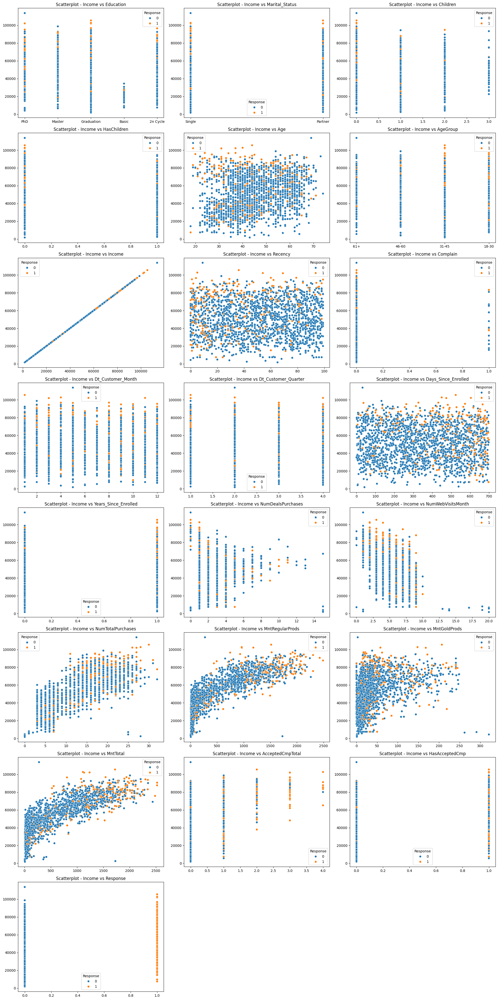

- Gráfico: Gráfico de Dispersão.

- Scatter Column: MntTotal.

- Hue Column: Response.


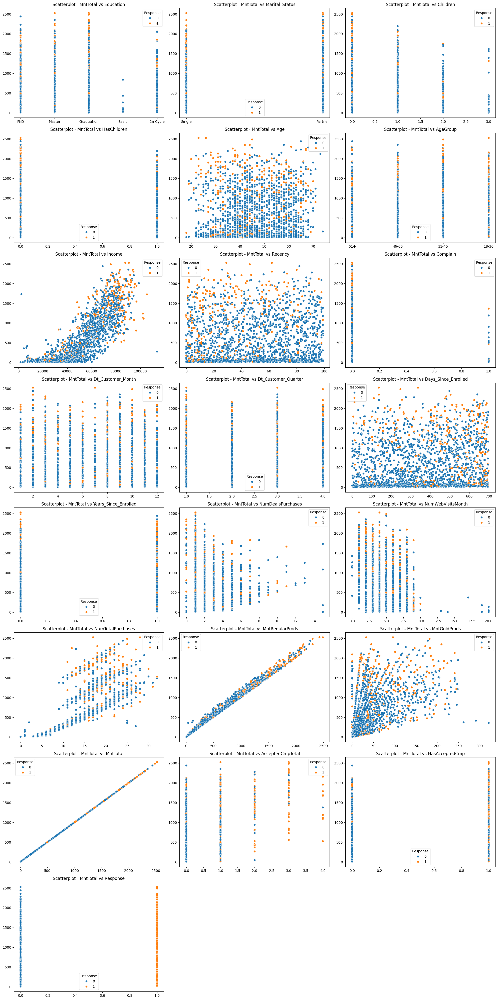

- Gráfico: Gráfico de Dispersão.

- Scatter Column: Age.

- Hue Column: Response.


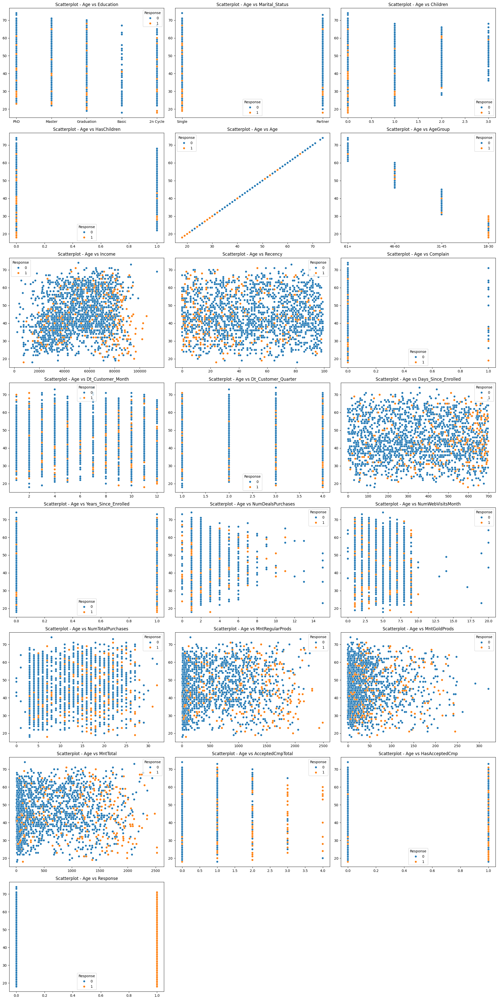

In [19]:
scatter_columns = ['Income', 'MntTotal', 'Age']

for i in scatter_columns:

    print('- Gráfico: Gráfico de Dispersão.\n')

    print(f'- Scatter Column: {i}.\n')

    print(f'- Hue Column: Response.')

    fn_charts_pandas.scatterplot(df_pd, df_pd.columns, i, 'Response')

    plt.savefig(f'../images/outputs/charts/pyspark/nb04_scatterplot_{i.lower()}.png', format = 'png', dpi = 75, bbox_inches = 'tight', transparent = True)

    plt.show()

### 04.3.3. Definindo as colunas com potencial de gerar os insights mais relevantes

In [20]:
hue_columns = [
    'HasChildren',
    'Marital_Status',
    'Education',
    'AgeGroup',
    'Years_Since_Enrolled',
    'HasAcceptedCmp',
    'Response',
]

### 04.3.4. Criando histogramas de acordo com as hue columns para extrair insights

- Gráfico: Histograma.

- Hue Column: HasChildren.


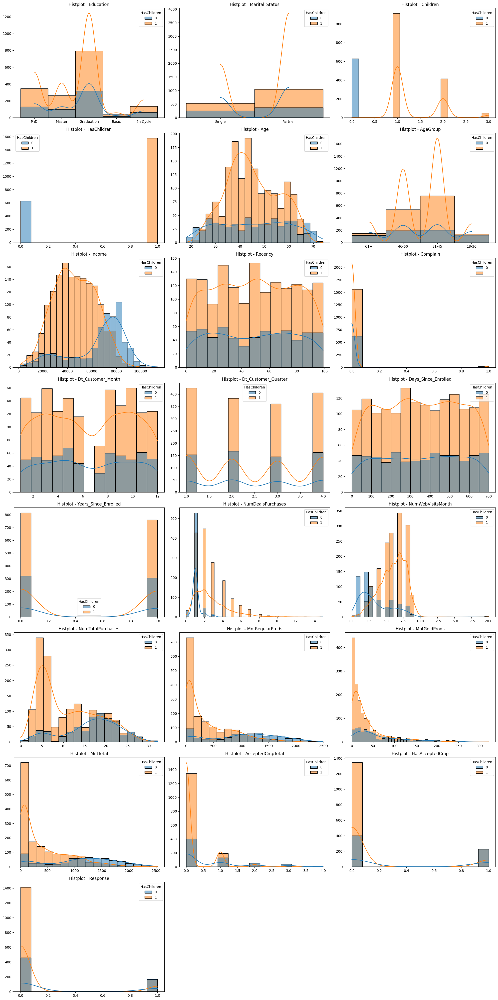

- Gráfico: Histograma.

- Hue Column: Marital_Status.


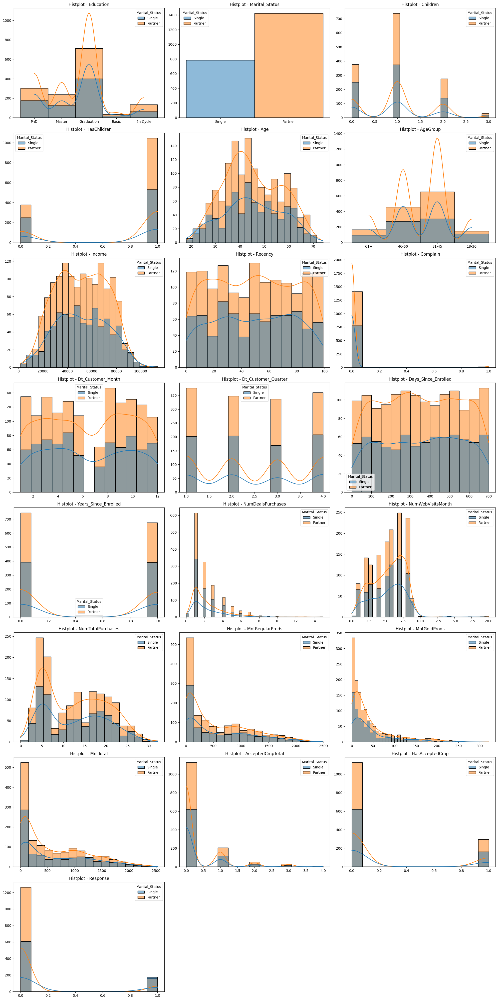

- Gráfico: Histograma.

- Hue Column: Education.


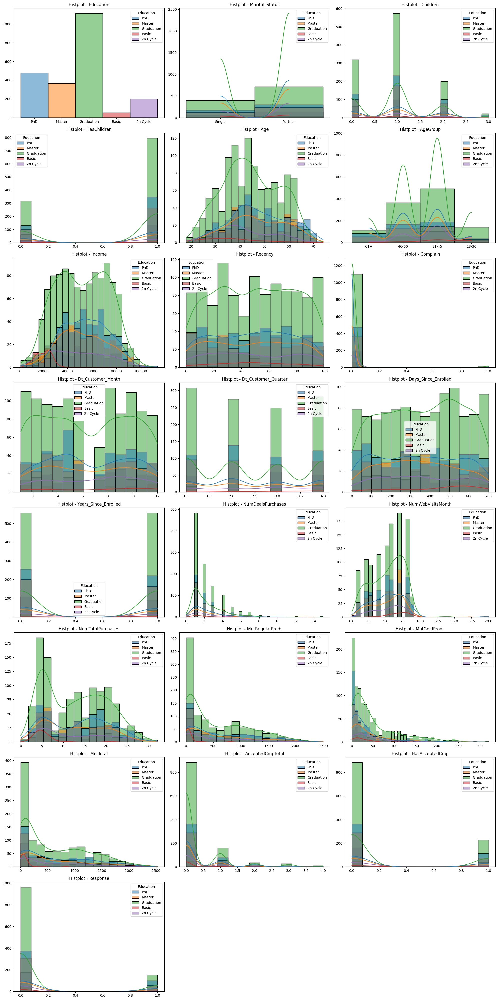

- Gráfico: Histograma.

- Hue Column: AgeGroup.


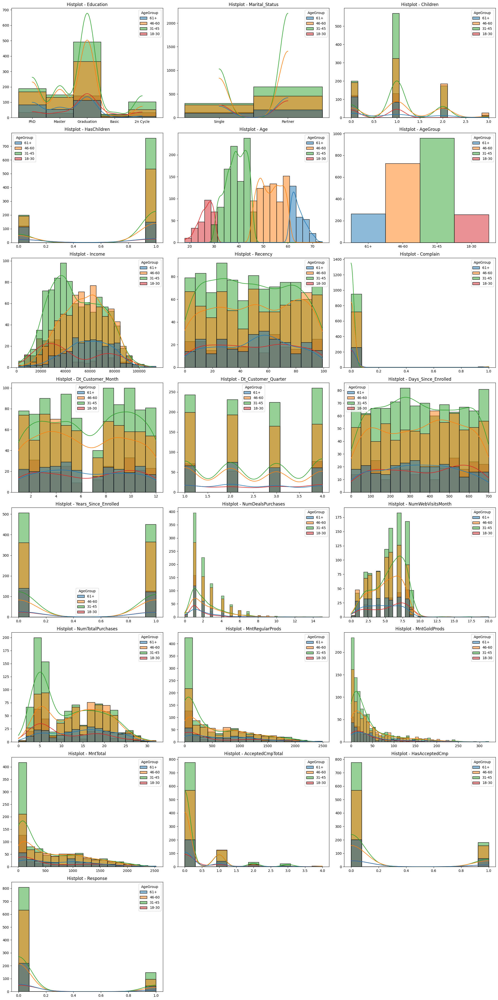

- Gráfico: Histograma.

- Hue Column: Years_Since_Enrolled.


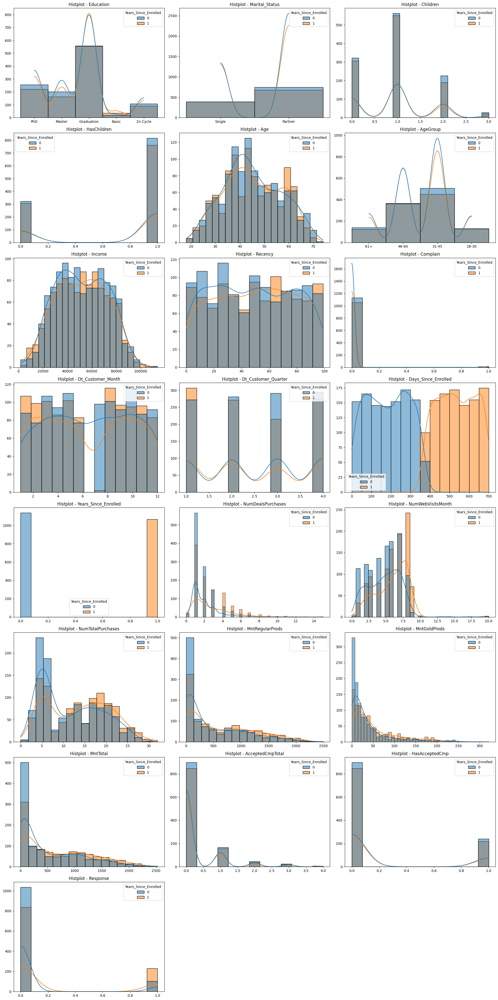

- Gráfico: Histograma.

- Hue Column: HasAcceptedCmp.


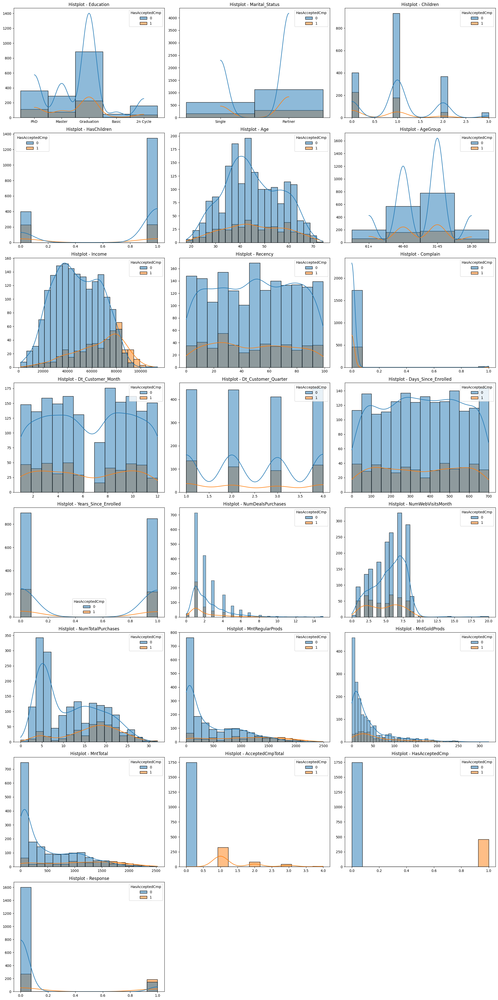

- Gráfico: Histograma.

- Hue Column: Response.


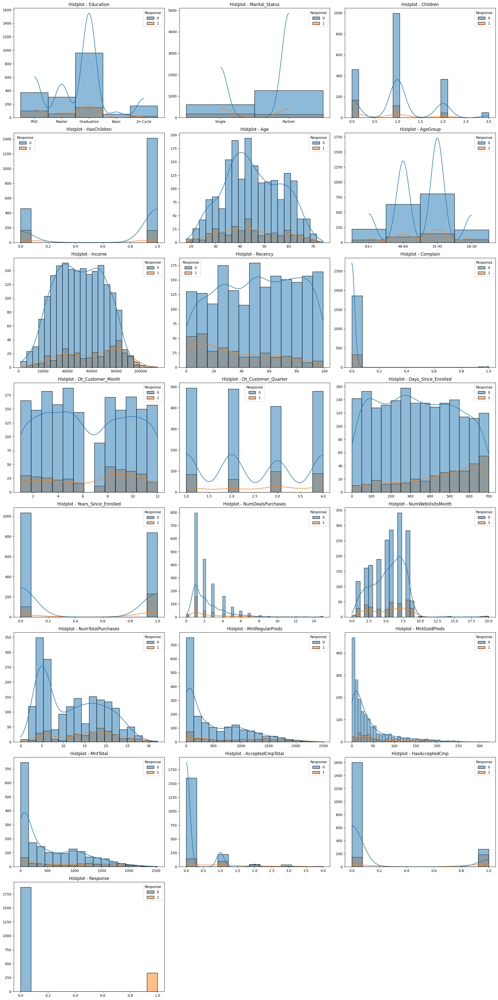

In [21]:
for i in hue_columns:

    print('- Gráfico: Histograma.\n')

    print(f'- Hue Column: {i}.')

    fn_charts_pandas.histplot(df_pd, df_pd.columns, i, kde = True)

    plt.savefig(f'../images/outputs/charts/pyspark/nb04_histplot_{i.lower()}.png', format = 'png', dpi = 75, bbox_inches = 'tight', transparent = True)

    plt.show()

### 04.3.5. Listando os insights encontrados nos histogramas

| Hue Column        | Column              | Intensidade | Insight                                                                 |
|-------------------|---------------------|-------------|---------------------------------------------------------------------------|
| HasChildren       | Age                 | Evidente    | Quem tem filhos, tende a ter a idade entre 35 e 60 anos                   |
| HasChildren       | Income              | Evidente    | Quem não tem filhos, tende a ter uma renda maior (o contrário também)      |
| HasChildren       | NumDealsPurchases   | Sutil       | Quem não tem filhos, tende a fazer menos compras com desconto (o contrário também) |
| HasChildren       | NumWebVisitsMonth   | Evidente    | Quem não tem filhos, tende a visitar menos o site de compras (o contrário também)  |
| HasChildren       | NumTotalPurchases   | Evidente    | Quem não tem filhos, tende a fazer mais compras (o contrário também)       |
| HasChildren       | MntTotal            | Sutil       | Quem não tem filhos, tende a gastar mais em compras (o contrário também)   |
| Education         | Income              | Evidente    | Quem tem maior escolaridade, tende a ter uma renda maior (o contrário também) |
| Education         | NumTotalPurchases   | Evidente    | Quem tem maior escolaridade, tende a fazer mais compras (o contrário também) |
| Education         | MntTotal            | Evidente    | Quem tem maior escolaridade, tende a gastar mais em compras (o contrário também) |
| AgeGroup          | Income              | Evidente    | Quem tem mais idade, tende a ter uma renda maior (o contrário também)      |
| AgeGroup          | MntTotal            | Sutil       | Quem tem mais idade, tende a gastar mais em compras (o contrário também)   |
| Years_Since_Enrolled | NumWebVisitsMonth | Sutil       | Quem tem mais tempo como cliente, tende a visitar mais o site (o contrário também) |
| HasAcceptCmp      | Income              | Evidente    | Quem aceitou as campanhas, tende a ter uma renda maior (o contrário também) |
| HasAcceptCmp      | NumTotalPurchases   | Evidente    | Quem aceitou as campanhas, tende a fazer mais compras (o contrário também) |
| HasAcceptCmp      | MntTotal            | Evidente    | Quem aceitou as campanhas, tende a gastar mais em compras (o contrário também) |
| Response          | Income              | Evidente    | Quem aceitou as campanhas, tende a ter uma renda maior (o contrário também) |
| Response          | Recency             | Evidente    | Quem aceitou as campanhas, tende a comprar frequentemente (o contrário também) |
| Response          | Years_Since_Enrolled | Evidente    | Quem aceitou as campanhas, tende a ser cliente há mais tempo (o contrário também) |
| Response          | NumTotalPurchases   | Evidente    | Quem aceitou as campanhas, tende a fazer mais compras (o contrário também) |
| Response          | MntTotal            | Evidente    | Quem aceitou as campanhas, tende a gastar mais em compras (o contrário também) |
| Response          | AcceptedCmpTotal    | Evidente    | Quem aceitou as campanhas, tende a aceitar uma nova campanha (o contrário também) |

### 04.3.6. Armazenando as principais colunas dos insights encontrados de acordo com sua hue column

In [22]:
columns_HasChildren = ['Age', 'Income', 'NumDealsPurchases', 'NumWebVisitsMonth', 'NumTotalPurchases', 'MntTotal']

columns_Education = ['Income', 'NumTotalPurchases', 'MntTotal']

columns_AgeGroup = ['Income', 'MntTotal']

columns_Years_Since_Enrolled = ['NumWebVisitsMonth']

columns_HasAcceptedCmp = ['Income', 'NumTotalPurchases', 'MntTotal']

columns_Response = ['Income', 'Recency', 'Years_Since_Enrolled', 'NumTotalPurchases', 'MntTotal', 'AcceptedCmpTotal']

### 04.3.7. Criando diagramas de caixa para corroborar os insights encontrados nos histogramas

- Gráfico: Diagrama de Caixa.

- Hue Column: HasChildren.


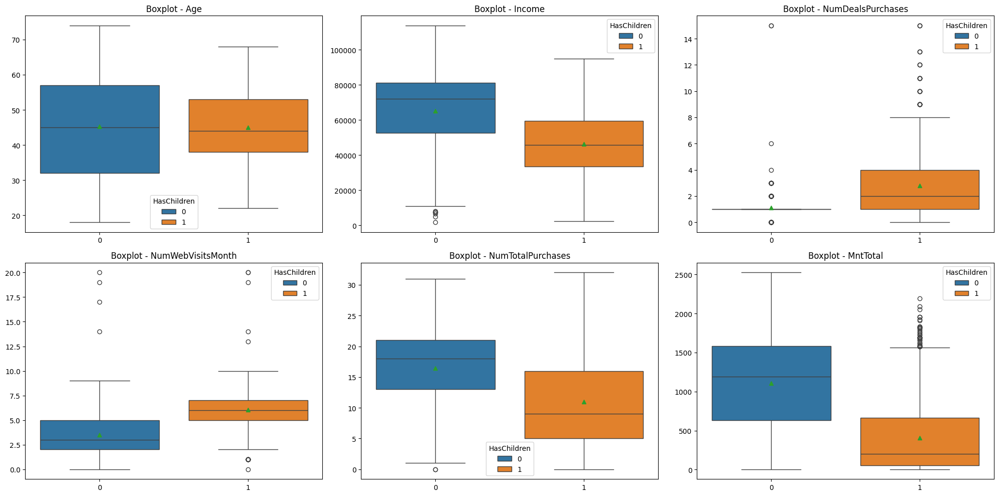

- Gráfico: Diagrama de Caixa.

- Hue Column: Education.


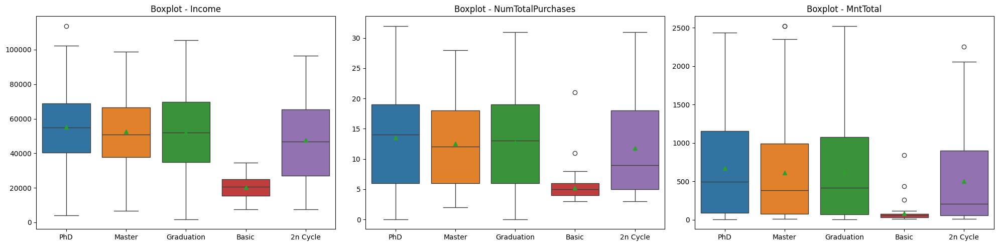

- Gráfico: Diagrama de Caixa.

- Hue Column: AgeGroup.


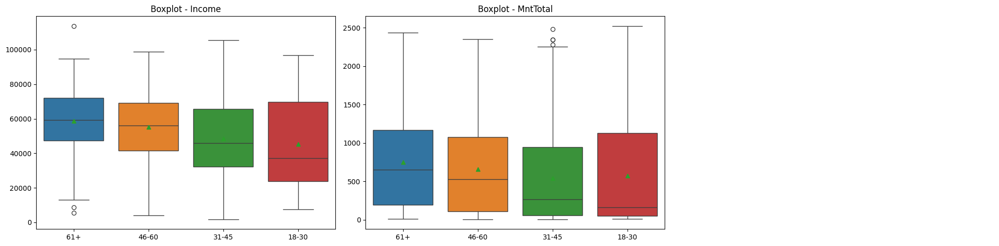

- Gráfico: Diagrama de Caixa.

- Hue Column: Years_Since_Enrolled.


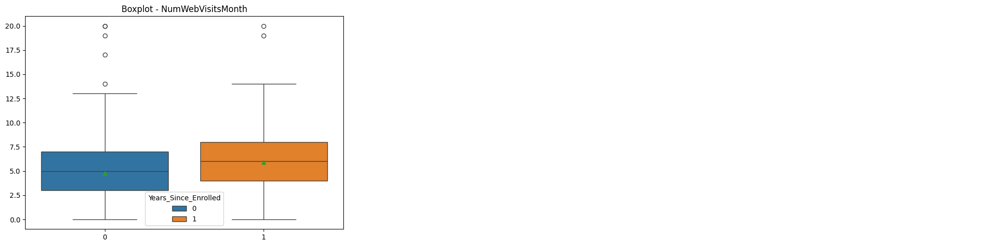

- Gráfico: Diagrama de Caixa.

- Hue Column: HasAcceptedCmp.


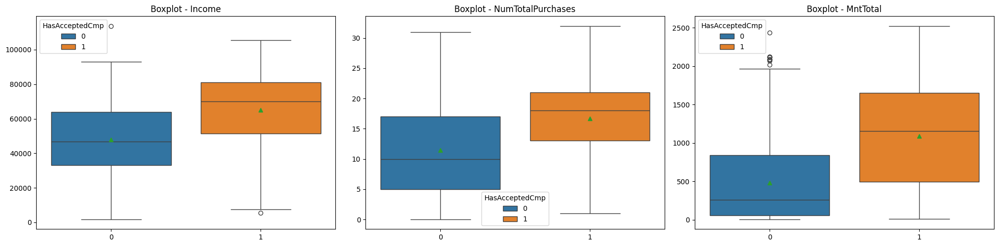

- Gráfico: Diagrama de Caixa.

- Hue Column: Response.


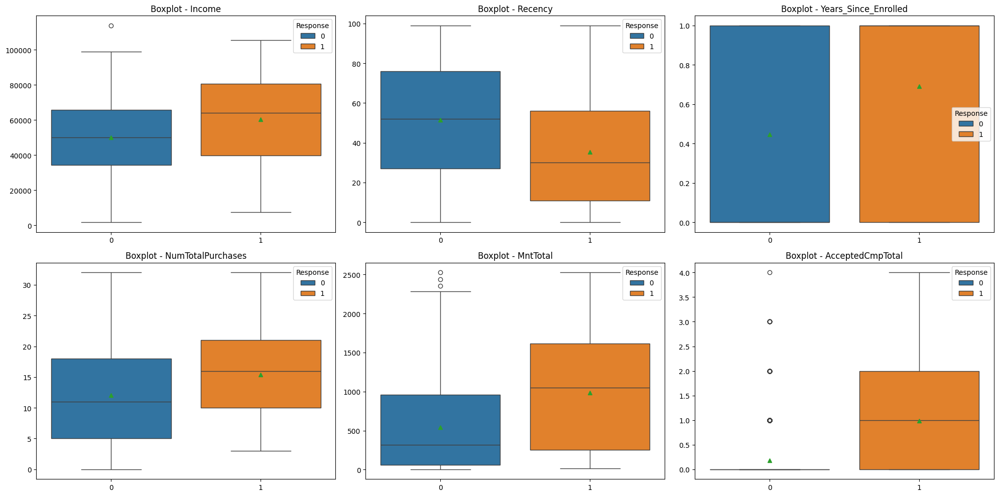

In [23]:
for i in hue_columns:

    if i == 'Marital_Status': continue

    print('- Gráfico: Diagrama de Caixa.\n')

    print(f'- Hue Column: {i}.')

    fn_charts_pandas.boxplot(df_pd, eval(f'columns_{i}'), i, i)

    plt.savefig(f'../images/outputs/charts/pyspark/nb04_boxplot_{i.lower()}.png', format = 'png', dpi = 75, bbox_inches = 'tight', transparent = True)

    plt.show()

### 04.3.8. Criando um mapa de calor para corroborar os insights encontrados nos histogramas

- Gráfico: Mapa de Calor.


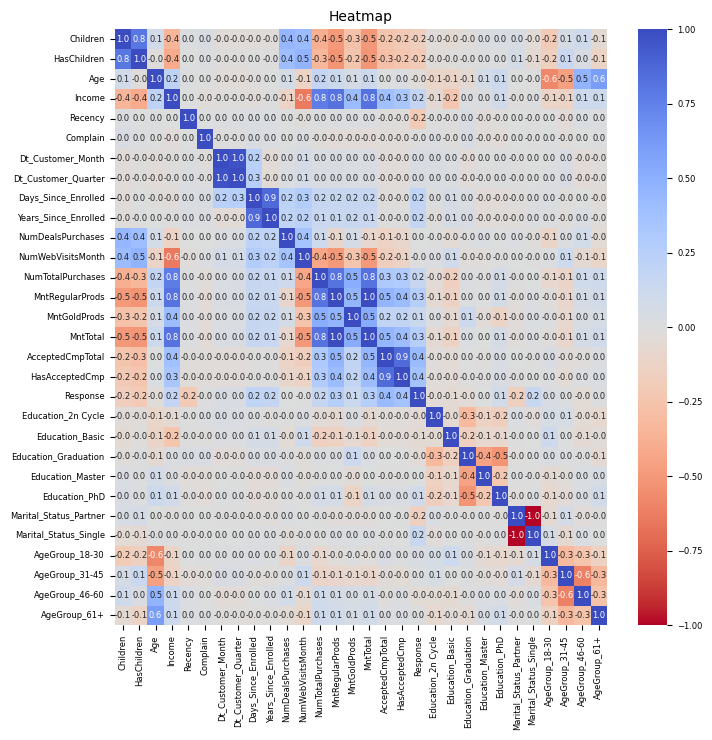

In [24]:
print('- Gráfico: Mapa de Calor.')

df_heatmap = pd.get_dummies(df_pd).corr()

fn_charts_pandas.heatmap(df_heatmap)

plt.savefig(f'../images/outputs/charts/pyspark/nb04_heatmap.png', format = 'png', dpi = 75, bbox_inches = 'tight', transparent = True)

plt.show()

### 04.3.9. Criando gráficos de barras para corroborar os insights encontrados nos histogramas e possivelmente gerando novos insights

- Gráfico: Gráfico de Barras.


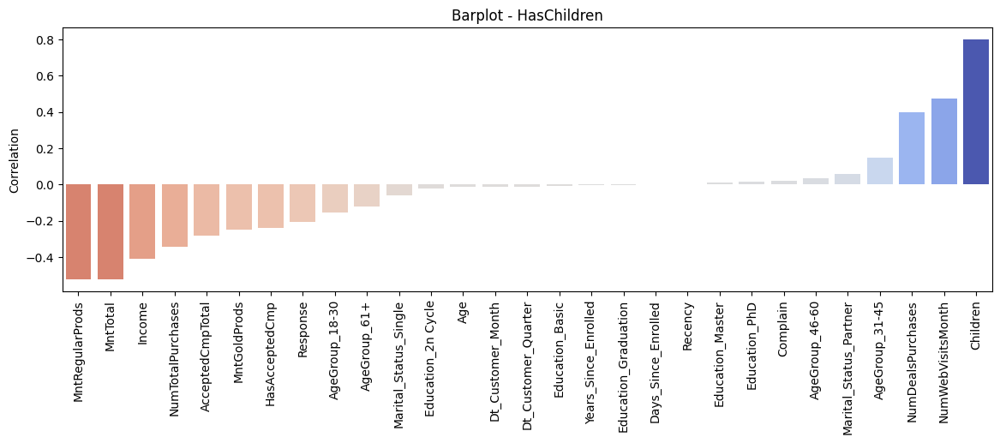

- Gráfico: Gráfico de Barras.


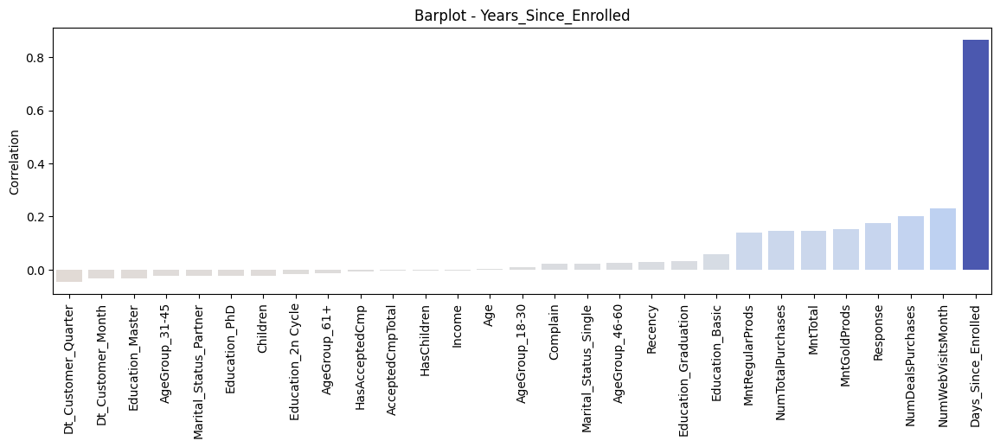

- Gráfico: Gráfico de Barras.


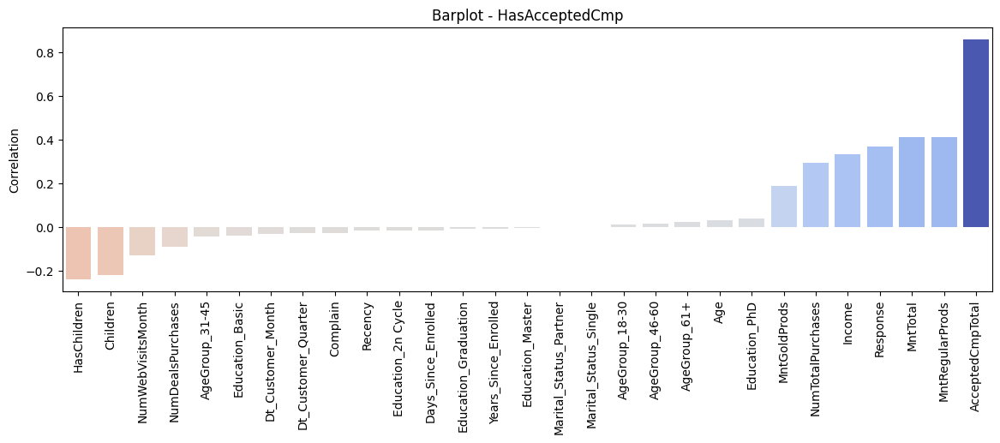

- Gráfico: Gráfico de Barras.


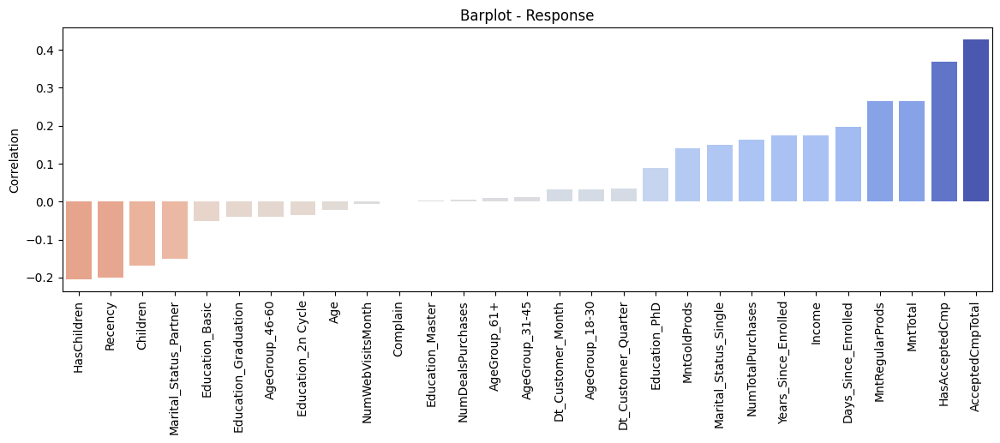

In [25]:
df_heatmap_unstack = (df_heatmap.unstack().rename('correlation').to_frame())

numeric_hue_columns = [hue_columns[i] for i in (0, 4, 5, 6)]

for i in numeric_hue_columns:

    print('- Gráfico: Gráfico de Barras.')

    corr = df_heatmap_unstack.loc[i].sort_values('correlation')[:-1]

    fn_charts_pandas.barplot_correlation(corr, corr['correlation'], corr['correlation'].max(), i)

    plt.savefig(f'../images/outputs/charts/pyspark/nb04_barplot_correlation_{i.lower()}.png', format = 'png', dpi = 75, bbox_inches = 'tight', transparent = True)

    plt.show()

## 04.4. Geração dos insights

### 04.4.1. Identificando os grupos de clientes com base na análise exploratória

| **Grupo 1**        | **Grupo 1**           | **Grupo 2**       | **Grupo 2**          |
|-----------------------------------|---------------------------------------|-----------------------------------|--------------------------------------|
| **Qualitativo**         | **Quantitativo**           | **Qualitativo**         | **Quantitativo**           |
| Renda média alta                  | Renda >= 51.287,00                     | Renda média baixa                 | Renda < 51.287,00                    |
| Faz mais compras                  | Compras >= 12                         | Faz menos compras                 | Compras < 12                        |
| Gasta mais em compras             | Gastos em compras >= 397,00           | Gasta menos em compras            | Gastos em compras < 397,00          |
| Não tem filhos                    | Filhos = 0                            | Tem filhos                        | Filhos != 0                         |
| Faz menos compras com desconto    | Compras com desconto <= 2             | Faz mais compras com desconto     | Compras com desconto > 2            |
| Visita menos o site               | Visitas ao site <= 6                  | Visita mais o site                | Visitas ao site > 6                 |
| Tem maior escolaridade            | Escolaridade != Basic                 | Tem menor escolaridade            | Escolaridade = Basic                |
| **Aceita mais campanhas**             | **Aceitou campanhas = 1**                 | **Aceita menos campanhas**            | **Aceitou campanhas = 0**               |
| Compra com mais frequência        | Frequência de compras <= 49           | Compra com menos frequência       | Frequência de compras > 49          |
| É cliente a mais tempo            | Dias como cliente >= 356              | É cliente a menos tempo           | Dias como cliente < 356             |
| Não possui um parceiro            | Estado civil = Single                 | Possui um parceiro                | Estado civil = Partner              |

### 04.4.2. Verificando o percentual de conversão da campanha inicialmente

- Agrupamento da coluna: Response
+--------+----------+-----+
|Response|Percentage|Count|
+--------+----------+-----+
|0       |84.9      |1872 |
|1       |15.1      |333  |
+--------+----------+-----+



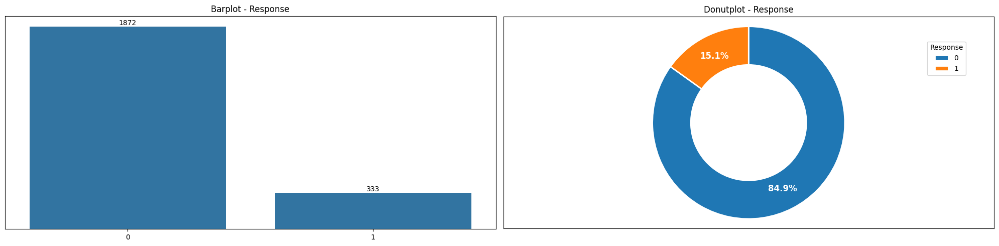

In [26]:
df_agg = fn_stats_pyspark.groupby_count(df, 'Response')

print(f'- Agrupamento da coluna: Response')

df_agg.show(truncate = False)

fn_charts_pandas.barplot_donutplot(df_agg.toPandas(), 'Response', 'Count')

plt.savefig(f'../images/outputs/charts/pyspark/nb04_barplot_donutplot_response_v1.png', format = 'png', dpi = 75, bbox_inches = 'tight', transparent = True)

plt.show()

### 04.4.3. Atualizando o dataset de acordo com o grupo mais propenso a aceitar campanhas

In [27]:
df = df.filter(col('Income') >= 51287.00) \
       .filter(col('NumTotalPurchases') >= 12) \
       .filter(col('MntTotal') >= 397.00) \
       .filter(col('HasChildren') == 0) \
       .filter(col('NumDealsPurchases') <= 2) \
       .filter(col('NumWebVisitsMonth') <= 6) \
       .filter(col('Education') != 'Basic') \
       .filter(col('HasAcceptedCmp') == 1) \
       .filter(col('Recency') <= 49) \
       .filter(col('Days_Since_Enrolled') >= 356) \
       .filter(col('Marital_Status') == 'Single')

### 04.4.4. Verificando o percentual de conversão da campanha de acordo com o grupo mais propenso a aceitar campanhas

- Agrupamento da coluna: Response
+--------+----------+-----+
|Response|Percentage|Count|
+--------+----------+-----+
|1       |100.0     |16   |
+--------+----------+-----+



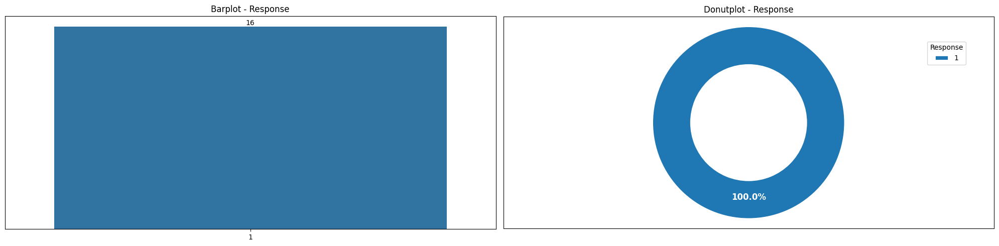

In [28]:
df_agg = fn_stats_pyspark.groupby_count(df, 'Response')

print(f'- Agrupamento da coluna: Response')

df_agg.show(truncate = False)

fn_charts_pandas.barplot_donutplot(df_agg.toPandas(), 'Response', 'Count')

plt.savefig(f'../images/outputs/charts/pyspark/nb04_barplot_donutplot_response_v2.png', format = 'png', dpi = 75, bbox_inches = 'tight', transparent = True)

plt.show()

### 04.4.5. Exibindo o dataset de acordo com o grupo mais propenso a aceitar campanhas

In [29]:
df.show()

+----------+--------------+--------+-----------+---+--------+--------+-------+--------+-----------------+-------------------+-------------------+--------------------+-----------------+-----------------+-----------------+---------------+------------+--------+----------------+--------------+--------+
| Education|Marital_Status|Children|HasChildren|Age|AgeGroup|  Income|Recency|Complain|Dt_Customer_Month|Dt_Customer_Quarter|Days_Since_Enrolled|Years_Since_Enrolled|NumDealsPurchases|NumWebVisitsMonth|NumTotalPurchases|MntRegularProds|MntGoldProds|MntTotal|AcceptedCmpTotal|HasAcceptedCmp|Response|
+----------+--------------+--------+-----------+---+--------+--------+-------+--------+-----------------+-------------------+-------------------+--------------------+-----------------+-----------------+-----------------+---------------+------------+--------+----------------+--------------+--------+
|       PhD|        Single|       0|          0| 68|     61+| 82800.0|     23|       0|             

### 04.4.6. Comentando os insights e o potencial de impacto da análise exploratória dos dados

Após realizar o estudo de acordo com o grupo mais propenso a aceitar campanhas conforme extraído pelos insights dessa análise exploratória dos dados, estimamos a evolução da coluna target (Response). 

Essa coluna Response corresponde a quantidade de clientes que aceitaram ou não a campanha final desse projeto piloto. 

Como resultado, inicialmente tínhamos um total de conversão de clientes de **15,1%** e após focar o estudo no grupo de clientes mais propensos a aceitar campanhas, o total de conversão foi para **100,00%**, representando assim um **crescimento de 84,9%**.

O resultado encontrado foi o ideal, onde **o objetivo máximo do projeto foi atingido**. O único ponto de ressalva é que foram aplicadas muitas condições para se chegar a esse resultado, deixando assim o número de clientes mais restrito. Dessa forma, é preciso entender com a área de Negócios e a equipe de Marketing se esse resultado atende as necessidades da área ou é preciso fazer ajustes, como por exemplo reduzir o número de parâmetros para que a campanha possa atingir um número maior de clientes.